# Profile Plotting for each Mechanims
This notebook is part of the SVM mechanism prediction [Main notebook](MAIN%20-%20SVM.ipynb)

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display
from pandasql import sqldf
from scripts.profile_reader import ProfileReader

pd.options.display.max_rows = 500
pd.options.display.max_columns = 300
%matplotlib inline

pqry = lambda q: sqldf(q, globals())

In [3]:
pr = ProfileReader(data_file='data\\Final_Berg JBS 2013 Supplemental Table 3_For SVM14Dec2017.xlsx',  
                       mechanism_file='data\\Final_Berg JBS 2013 Supplemental Table 3_For SVM14Dec2017 - Mechanisms.xlsx')
# read in data. Make column 2-level index, level 0 is system, level 1 ir readout
# row indices are mechanism, agent, concentration
data = pr.parse_profiles(keep_column_names=False)

# Impute missing
grouped = data.groupby(data.index.get_level_values(0).values)
f = lambda x: x.fillna(x.mean())
data = grouped.transform(f)

#data.columns = [':'.join(col).strip() for col in data.columns.values]

In [4]:
data

System                                                                 BrEPI_IL-1b/TNF-a/IFN-g_24  \
Marker                                                                                  CD87/uPAR   
mech                        agent                         conc                                      
AhR agonist                  FICZ                          1000 nM                       0.031453   
                                                           111.1 nM                      0.032902   
                                                           333.3 nM                      0.023110   
                                                           37 nM                         0.031829   
Calcineurin inhibitor        Cyclosporin A                 1111.1 nM                    -0.035647   
                                                           123.5 nM                     -0.015034   
                                                           3333.3 nM                    -0.007602   
                                                           370.4 nM                     -0.025787   
                                                           41.2 nM                      -0.023897   
                             FK-506                        1111.1 nM                     0.015282   
                                                           123.5 nM                      0.003214   
                                                           13.7 nM                      -0.002110   
                                                           3333.3 nM                     0.023245   
                                                           370.4 nM                      0.011094   
                                                           4.6 nM                       -0.044640   
                                                           41.2 nM                      -0.005886   
EGFR inhibitor               BIBX1382                      1111.1 nM                    -0.176633   
                                                           3333.3 nM                    -0.194103   
                                                           370.4 nM                     -0.087499   
                             EGFR/ErbB-2/ErbB-4 Inhibitor  123.5 nM                     -0.186000   
                                                           370.4 nM                     -0.208000   
                             Erlotinib                     10000 nM                     -0.267212   
                                                           1111.1 nM                    -0.179475   
                                                           3333.3 nM                    -0.218127   
                                                           370.4 nM                     -0.120941   
                             Gefitinib                     1000 nM                      -0.206667   
                                                           111.1 nM                     -0.155000   
                                                           3000 nM                      -0.213667   
                                                           333.3 nM                     -0.201000   
                             Vandetanib                    1111.1 nM                    -0.191530   
SR Ca++ ATPase inhibitor     Thapsigargin                  1.5 nM                        0.006916   
                                                           13.7 nM                      -0.169465   
                                                           4.6 nM                        0.009516   
                                                           41.2 nM                      -0.255211   
EP agonist                   Prostaglandin E1              10000 nM                      0.006398   
                                                           1111.1 nM                    -0.009267   
                                                           33

## Plot each mechanism class 

AhR agonist


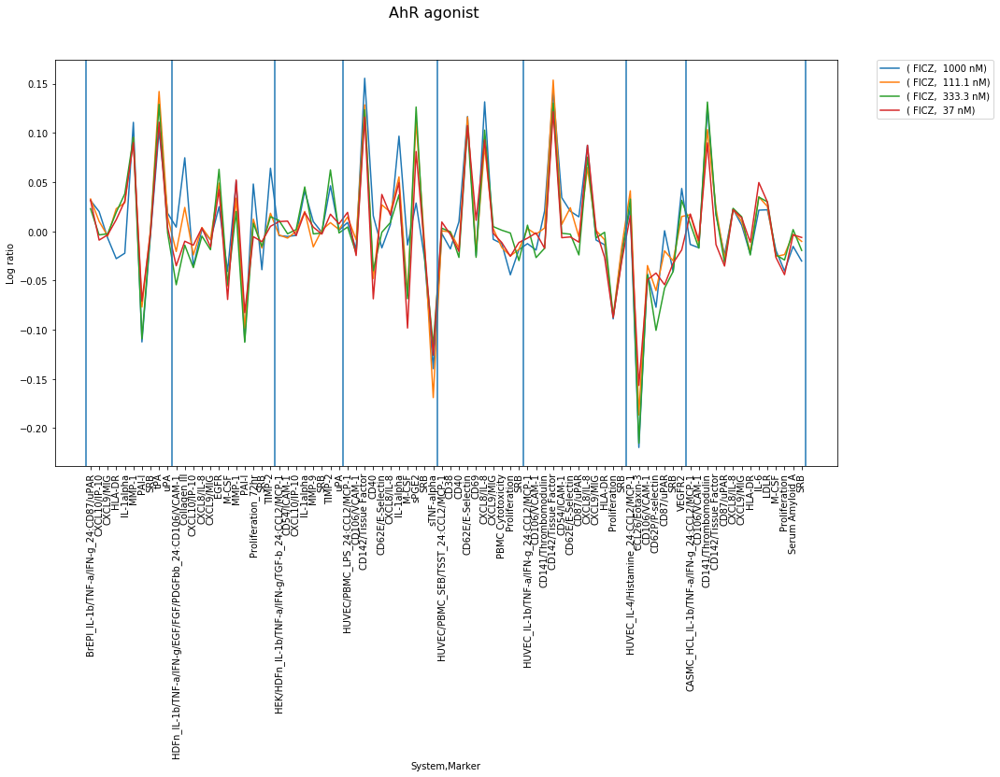

Calcineurin inhibitor


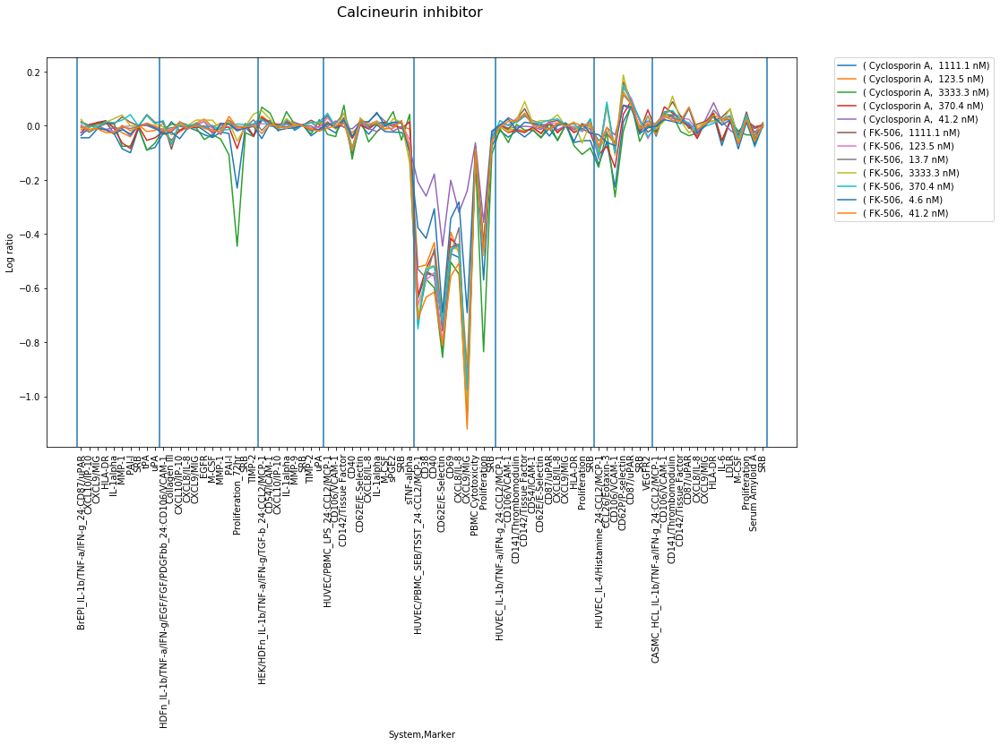

EGFR inhibitor


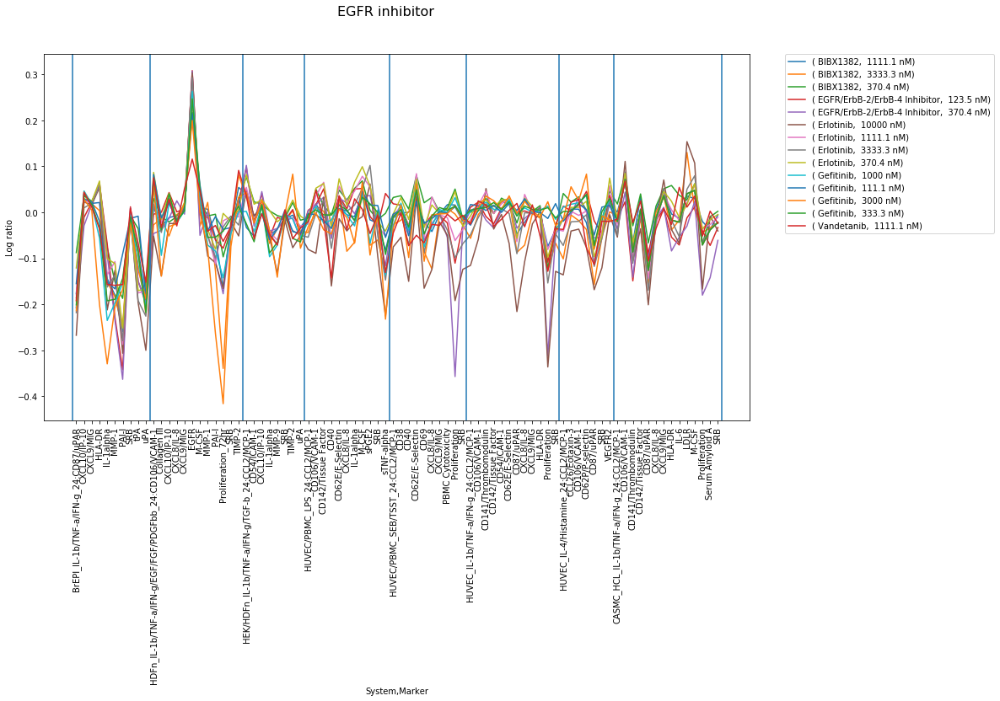

SR Ca++ ATPase inhibitor


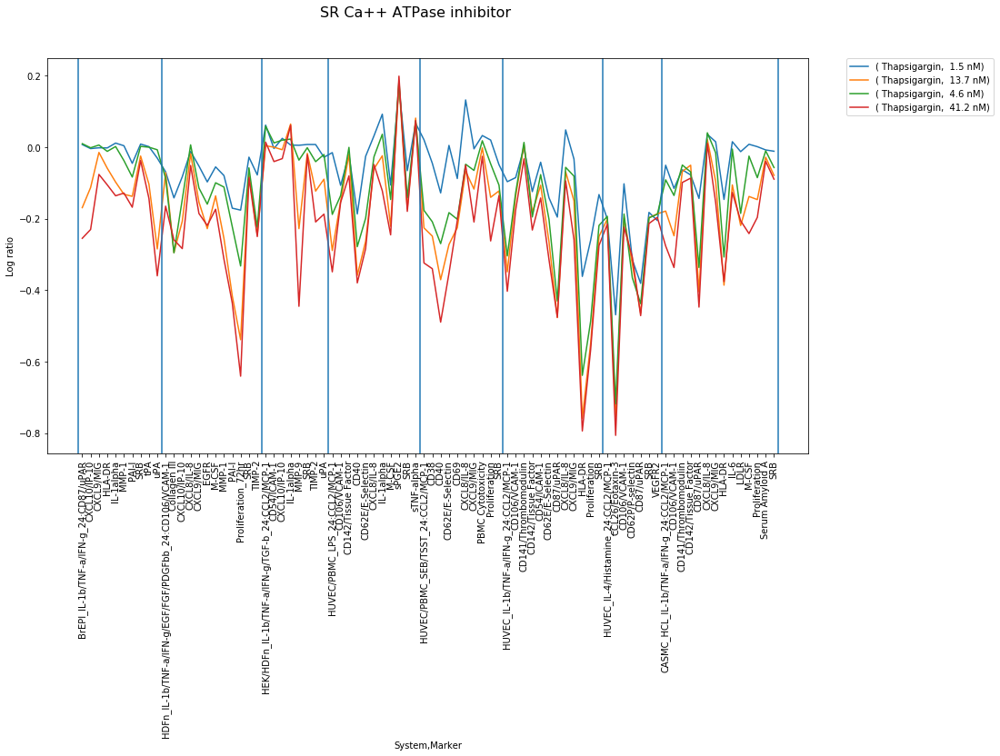

EP agonist


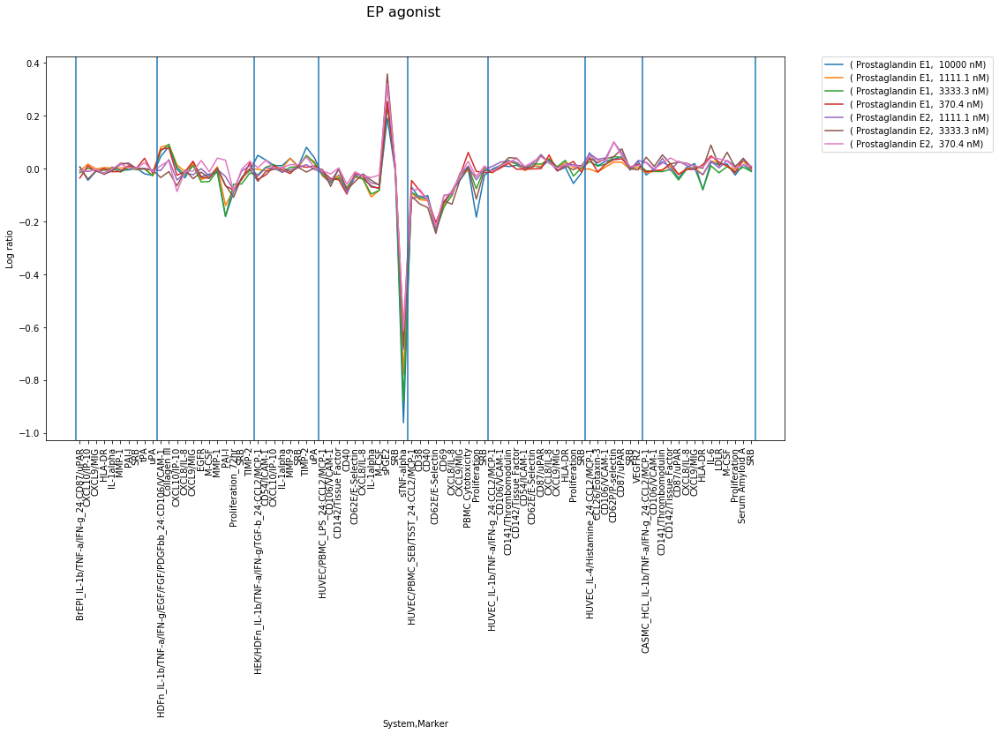

ER agonist


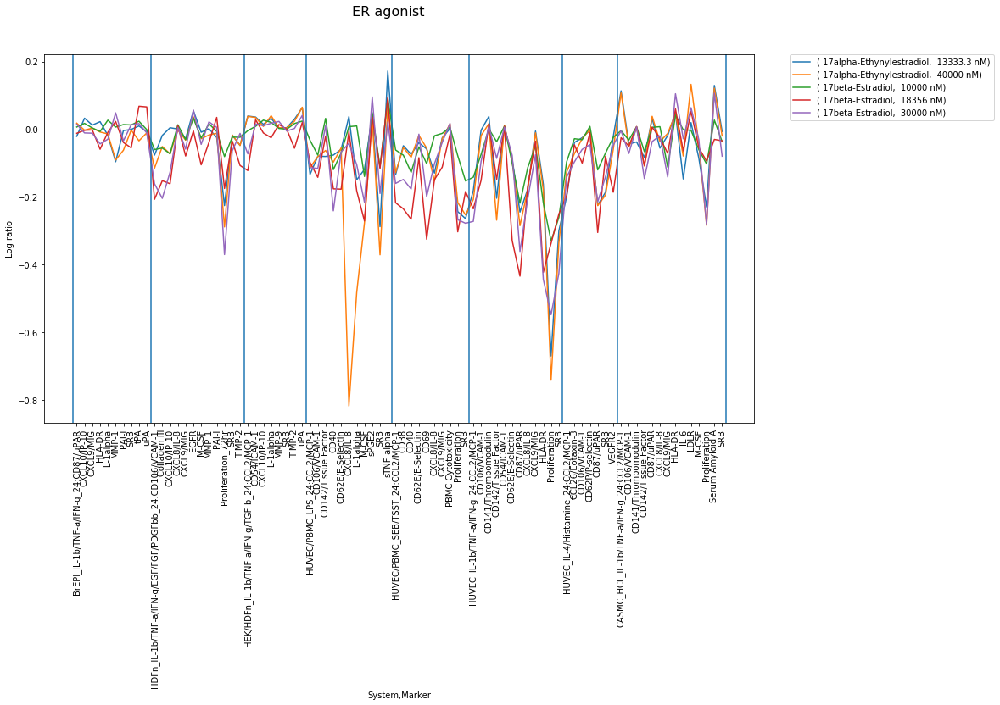

GR agonist


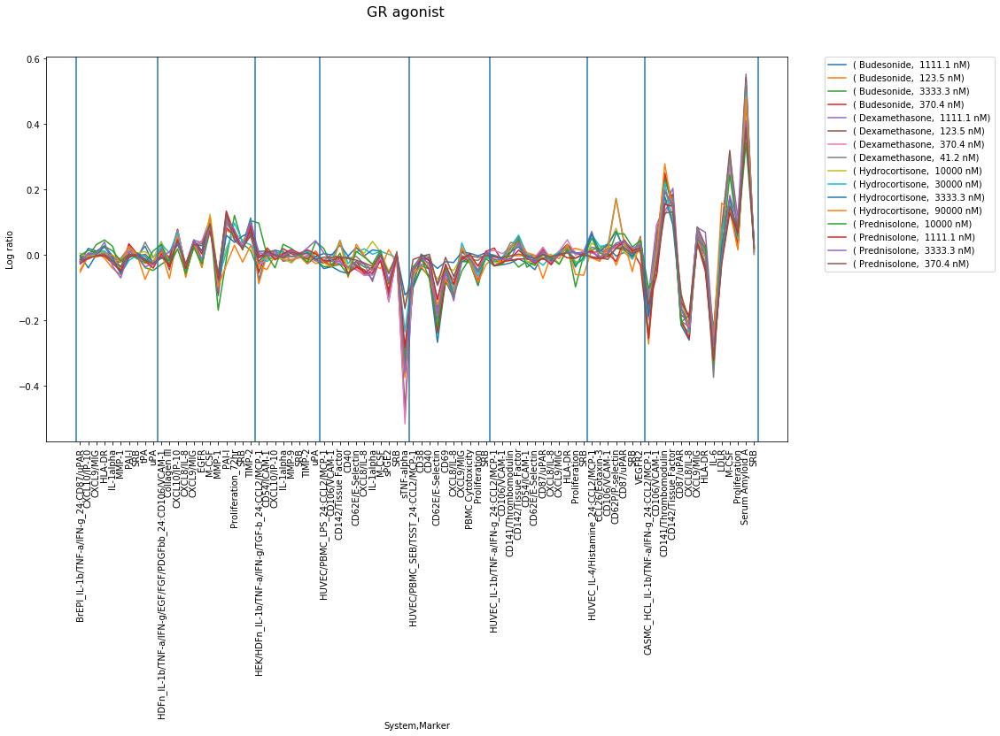

H1 antagonist


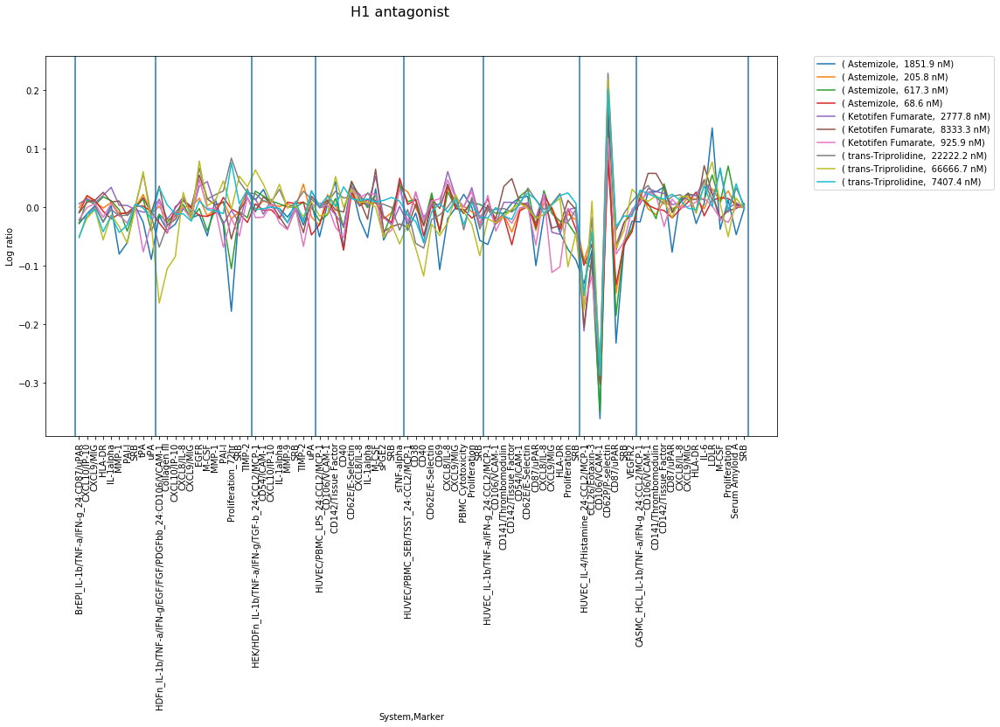

HDAC inhibitor


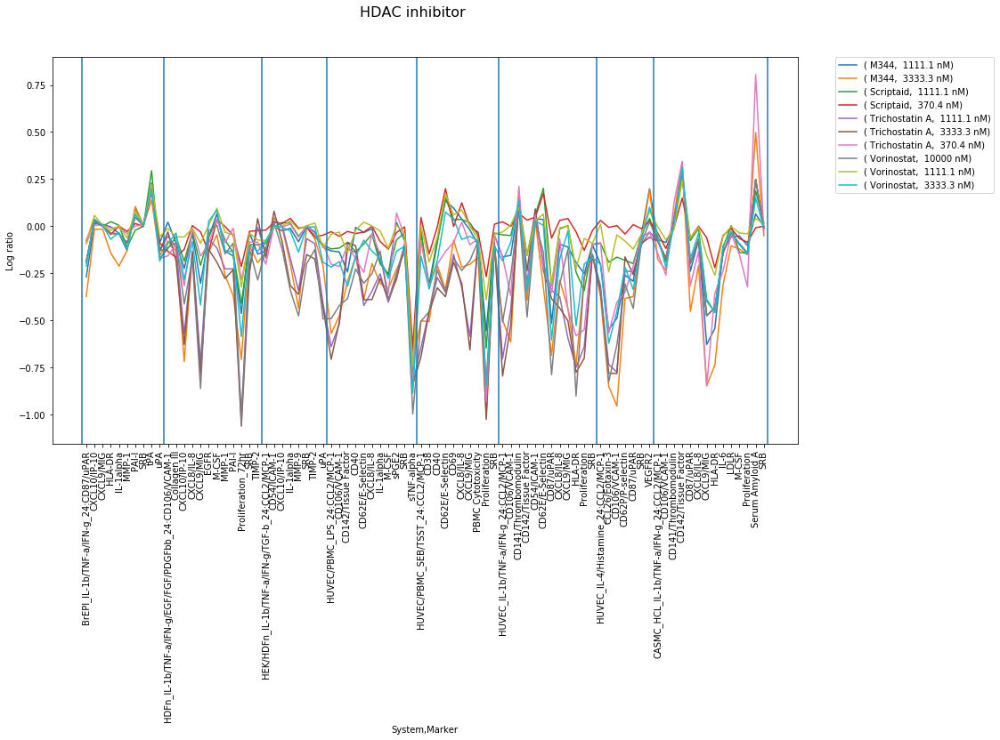

HMG-CoA reductase inhibitor


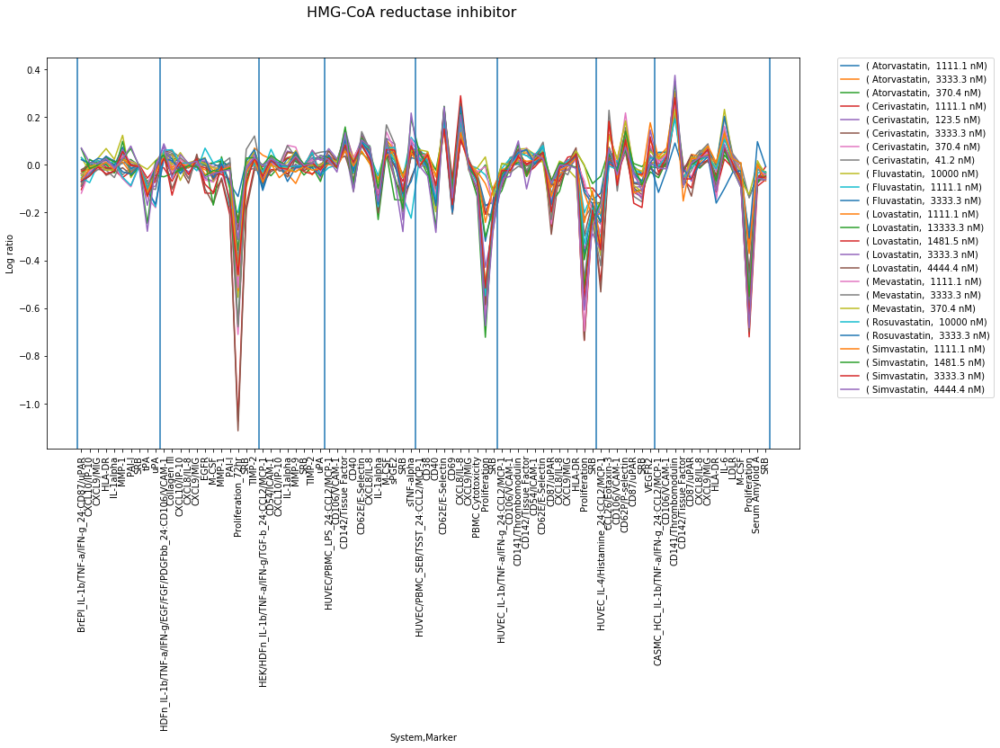

Hsp90 inhibitor


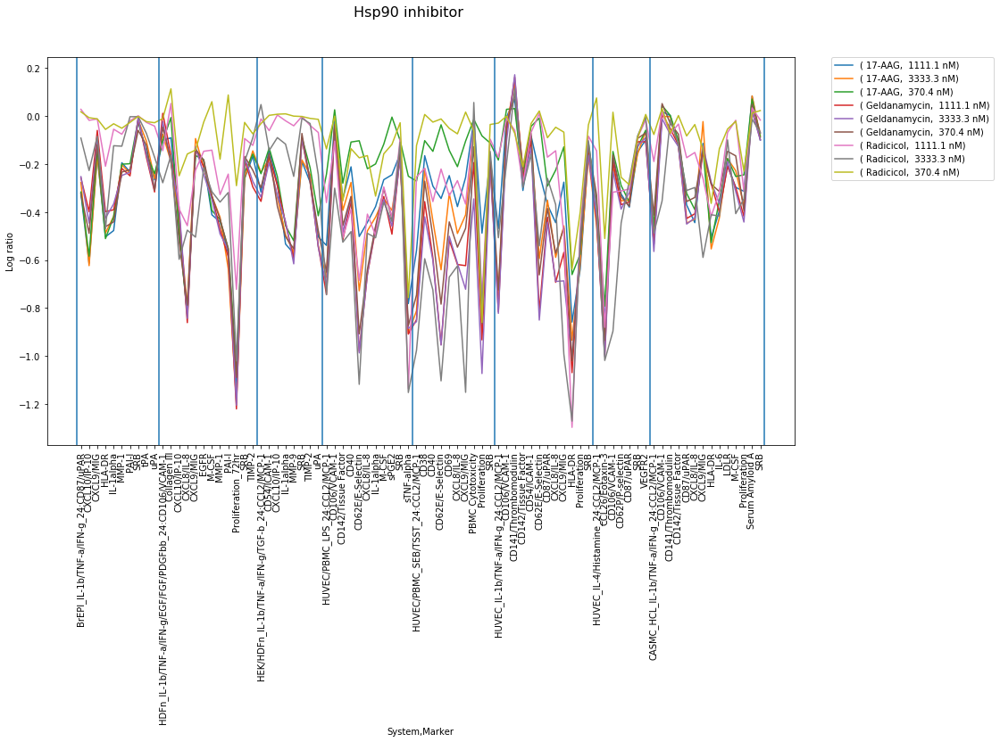

IKK2 inhibitor


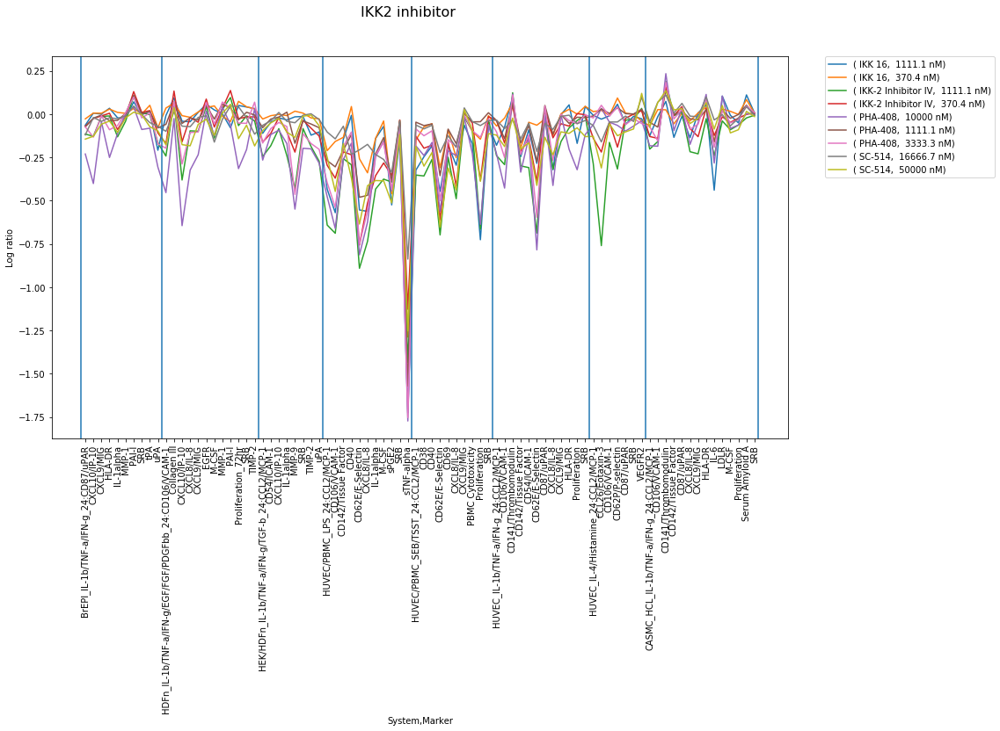

IL-17R agonist


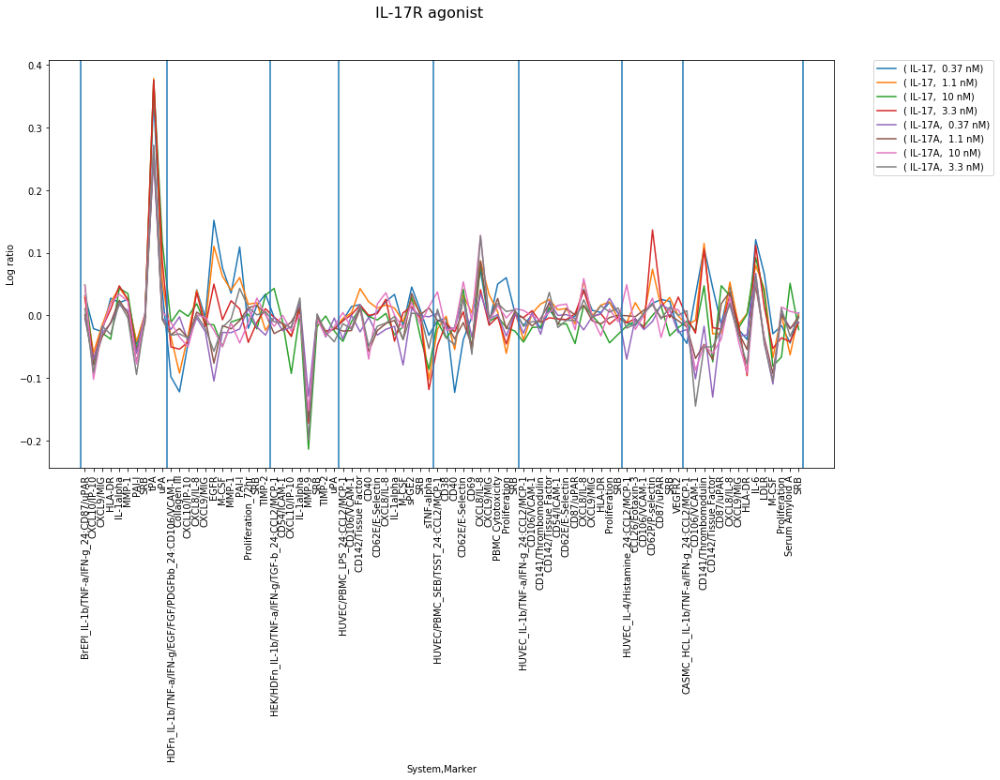

JAK inhibitor


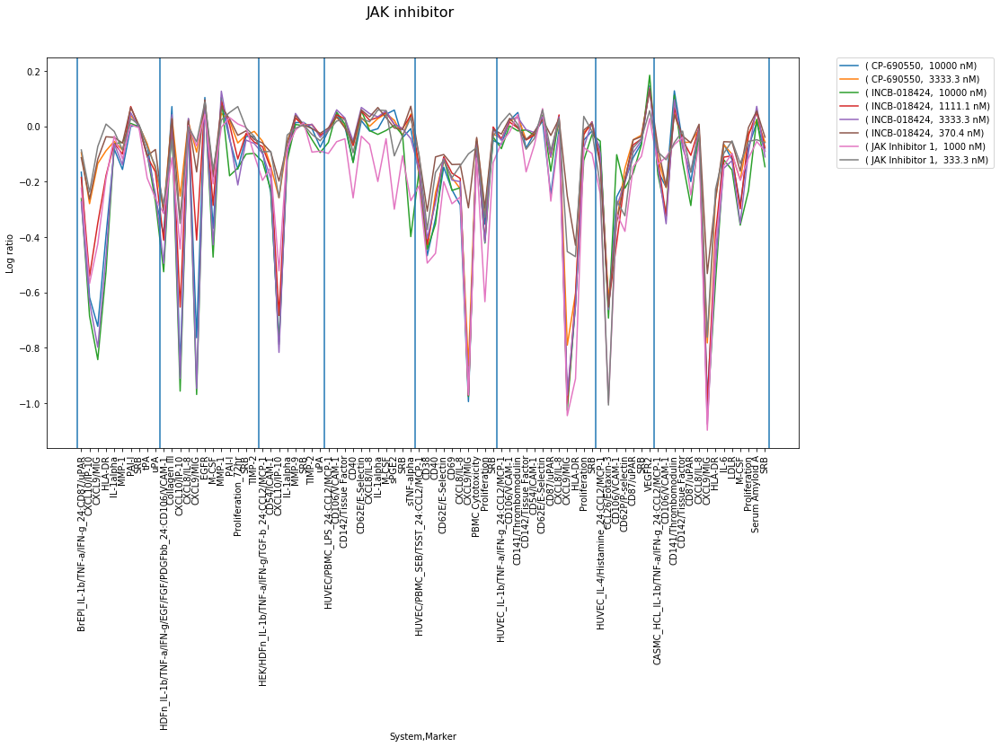

MEK inhibitor


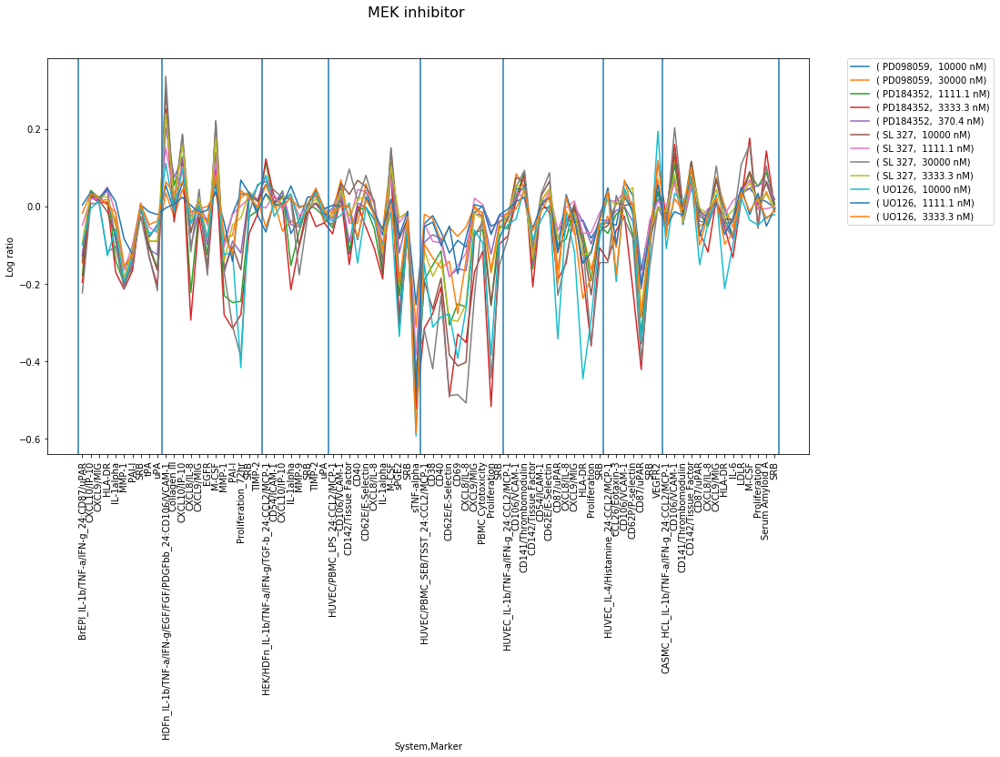

Microtubule disruptor


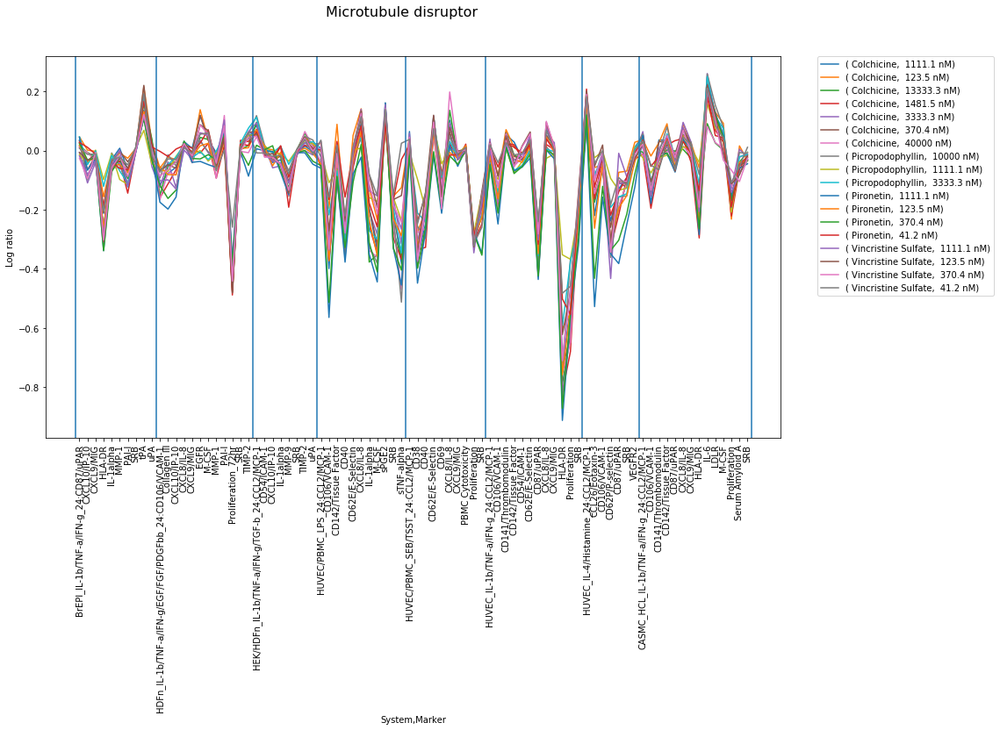

Microtubule stabilizer


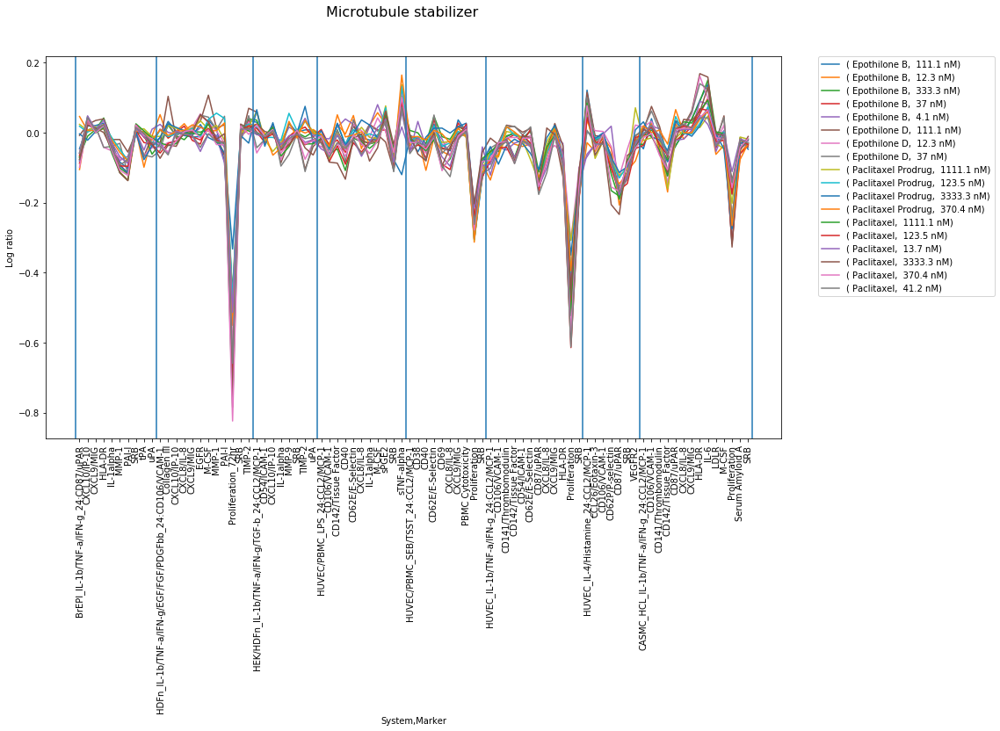

Mitochondrial inhibitor


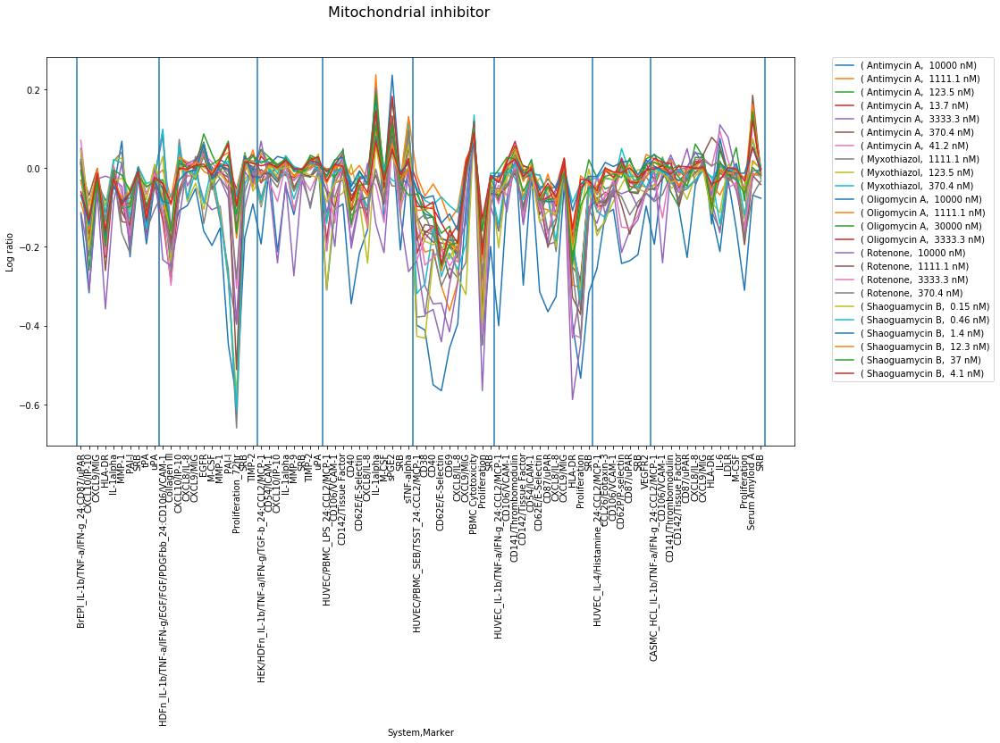

mTOR inhibitor


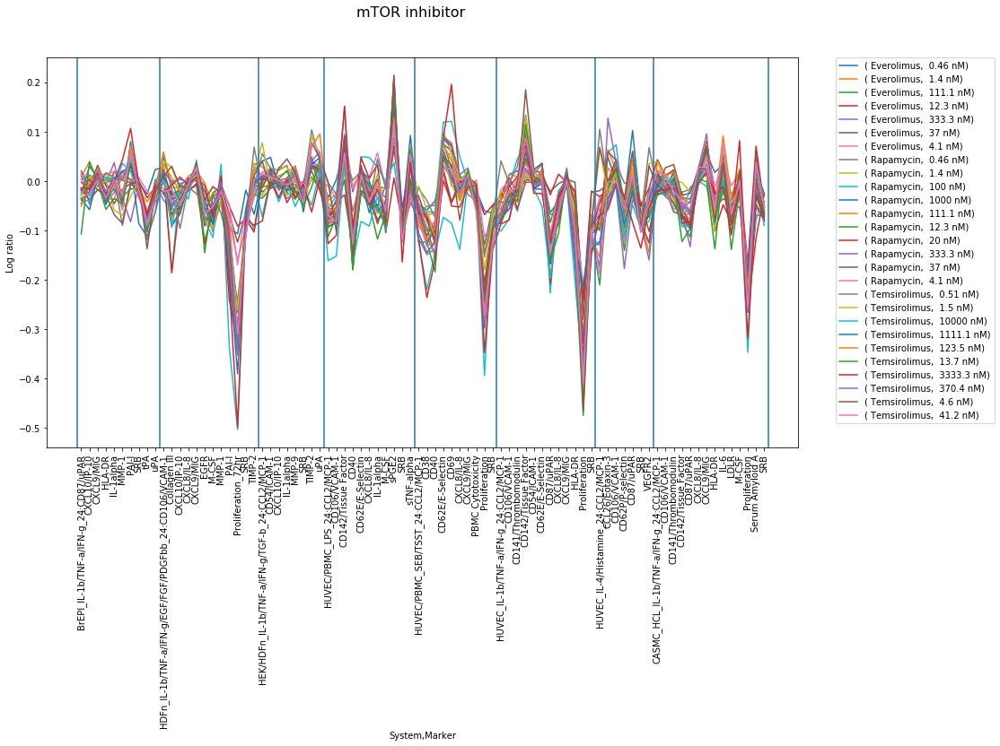

p38 MAPK inhibitor


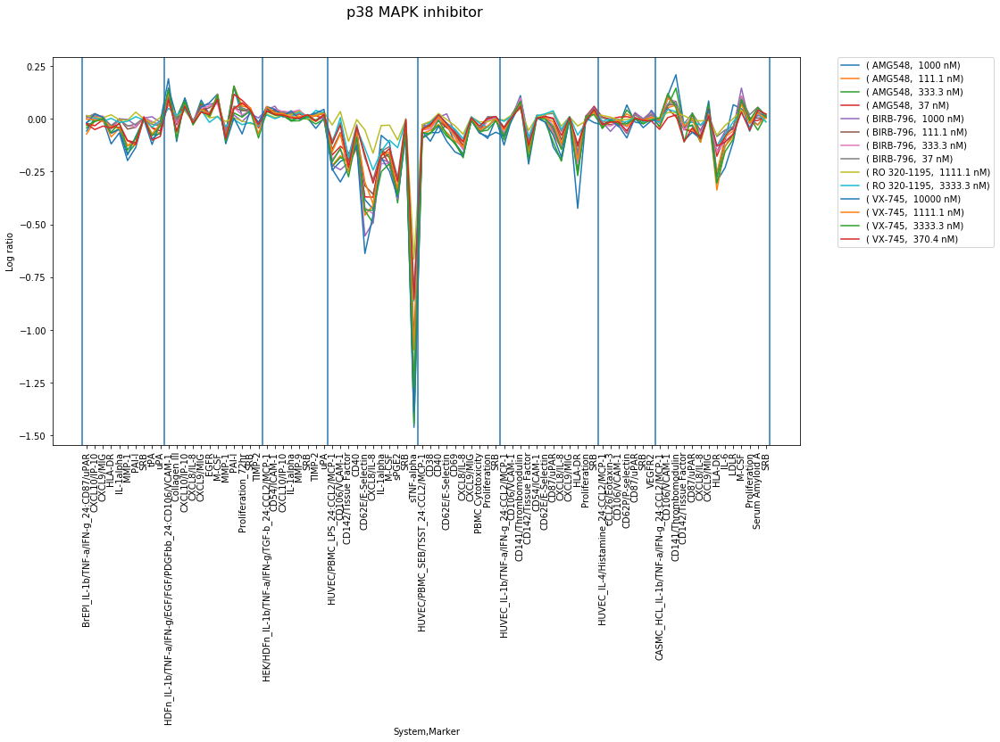

PDE IV inhibitor


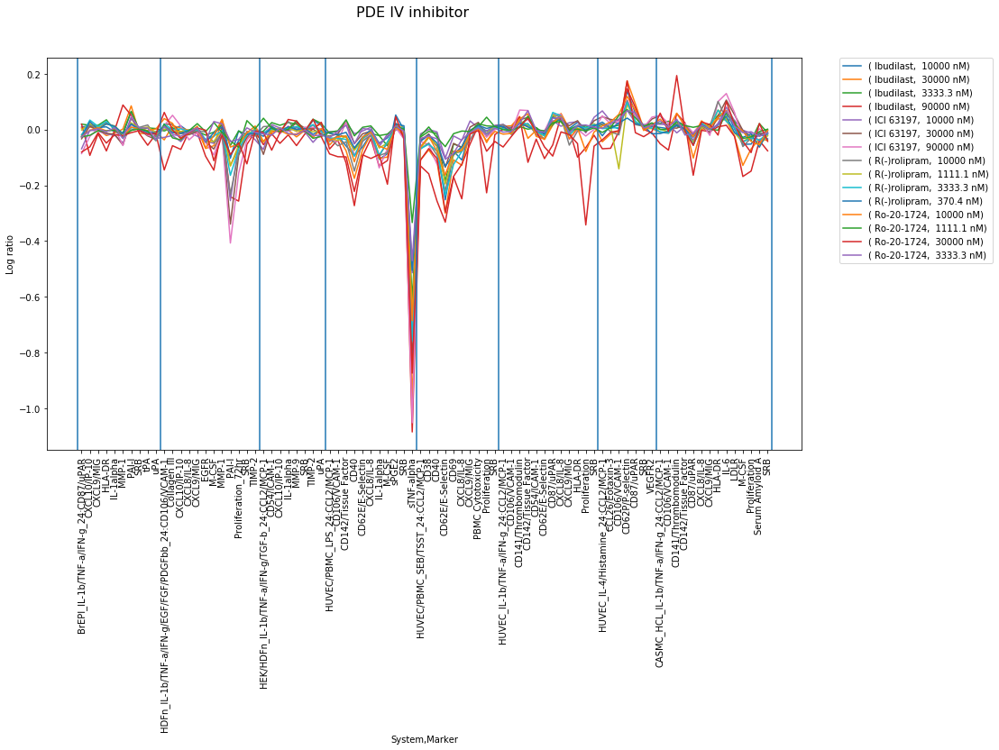

PI3K inhibitor


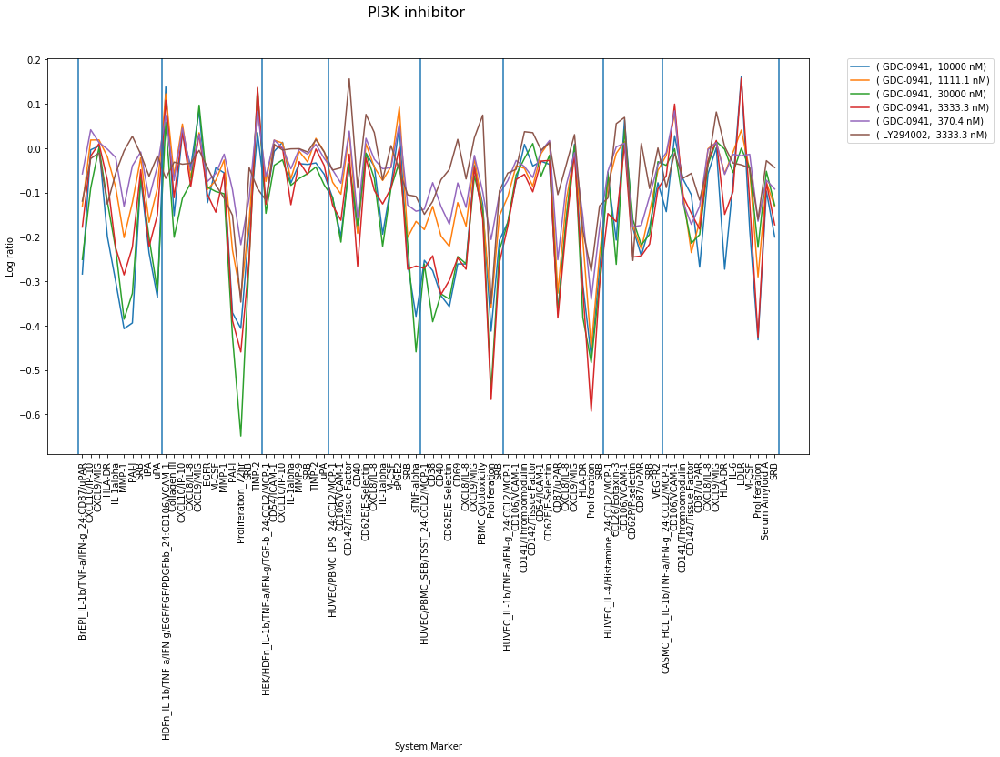

PKC (c+n) inhibitor


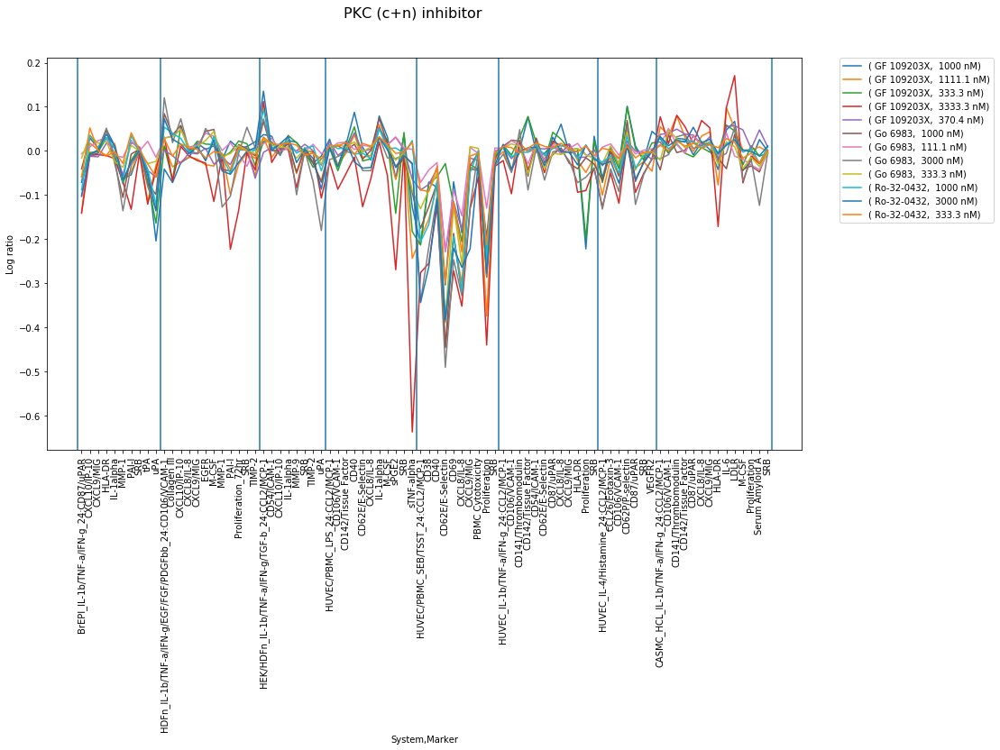

Proteasome inhibitor


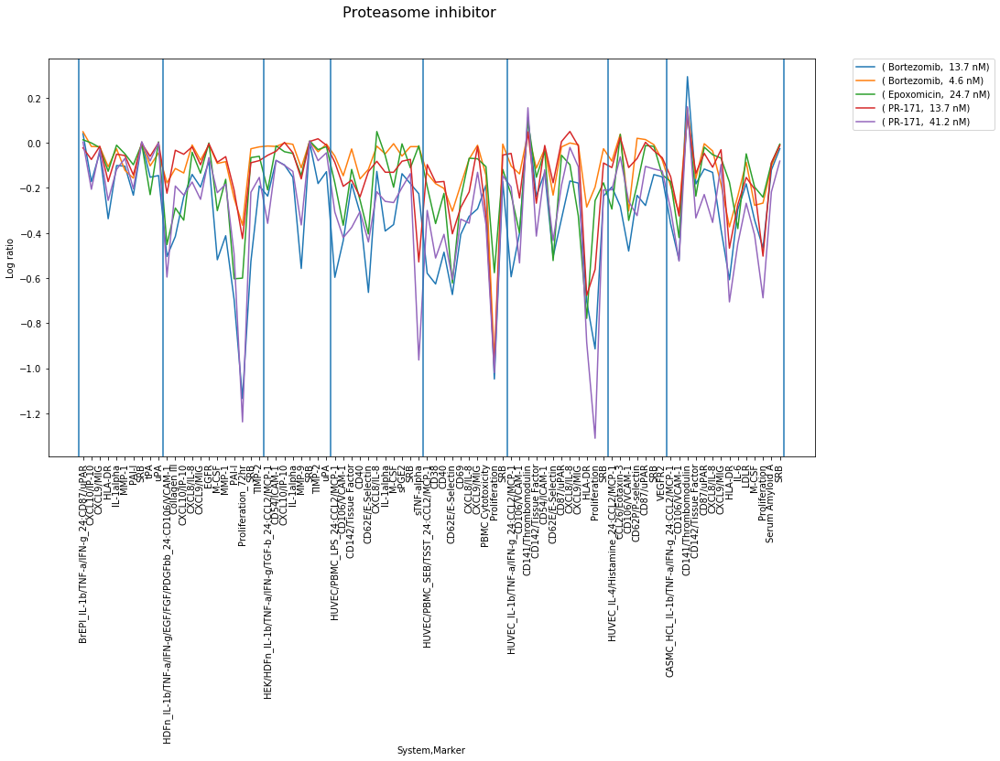

RAR/RXR agonist


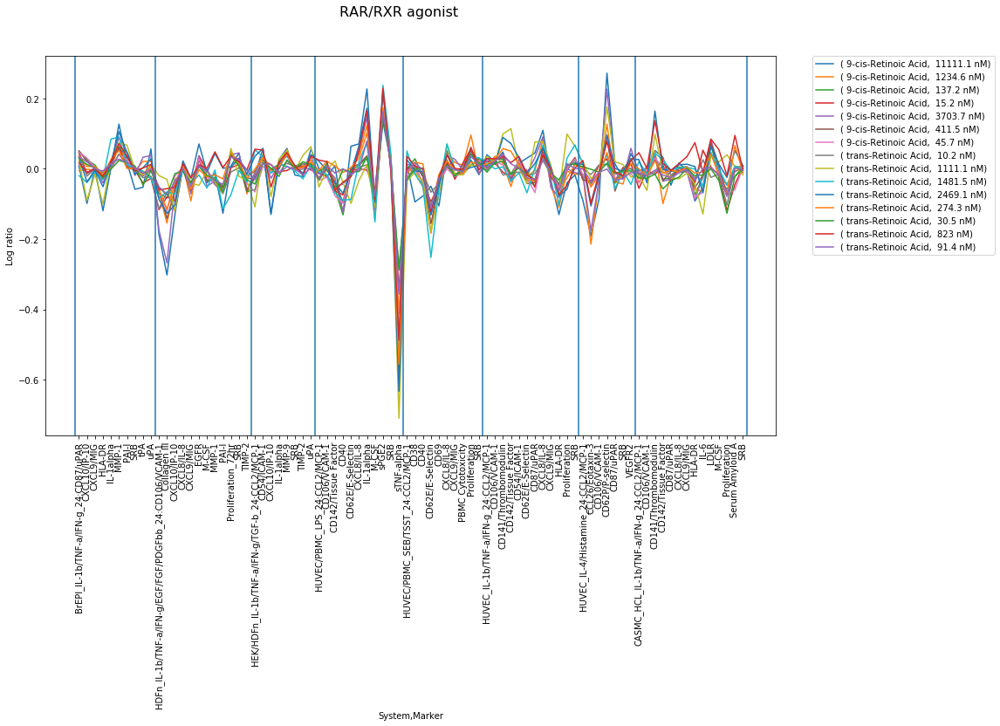

Src family inhibitor


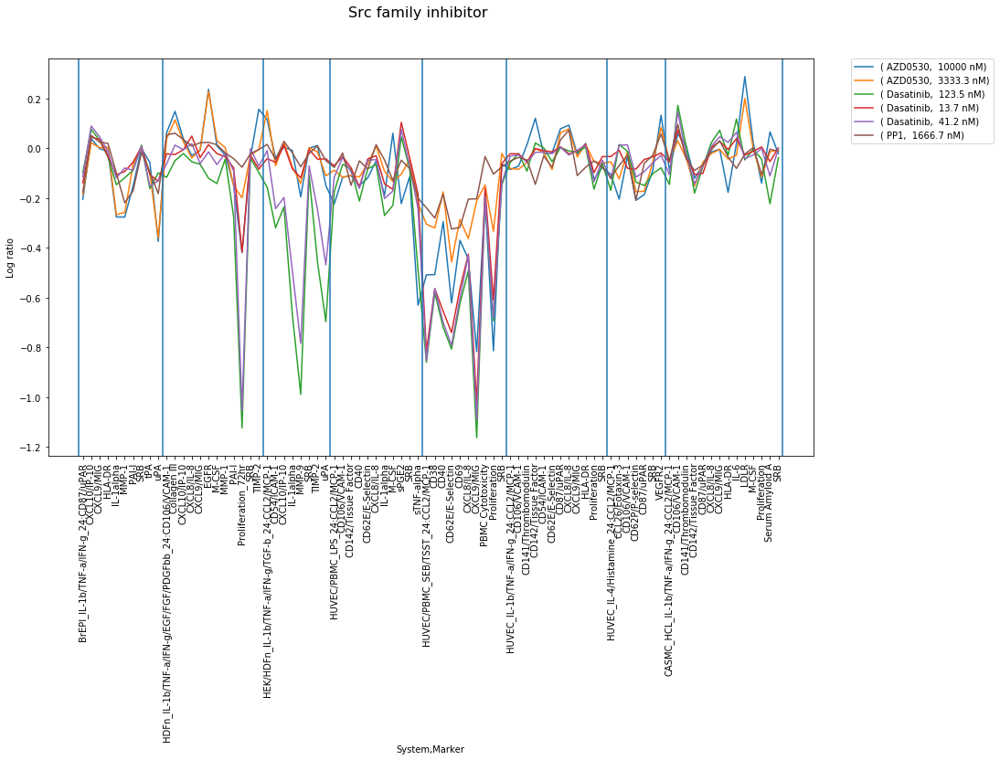

TNF-α antagonist


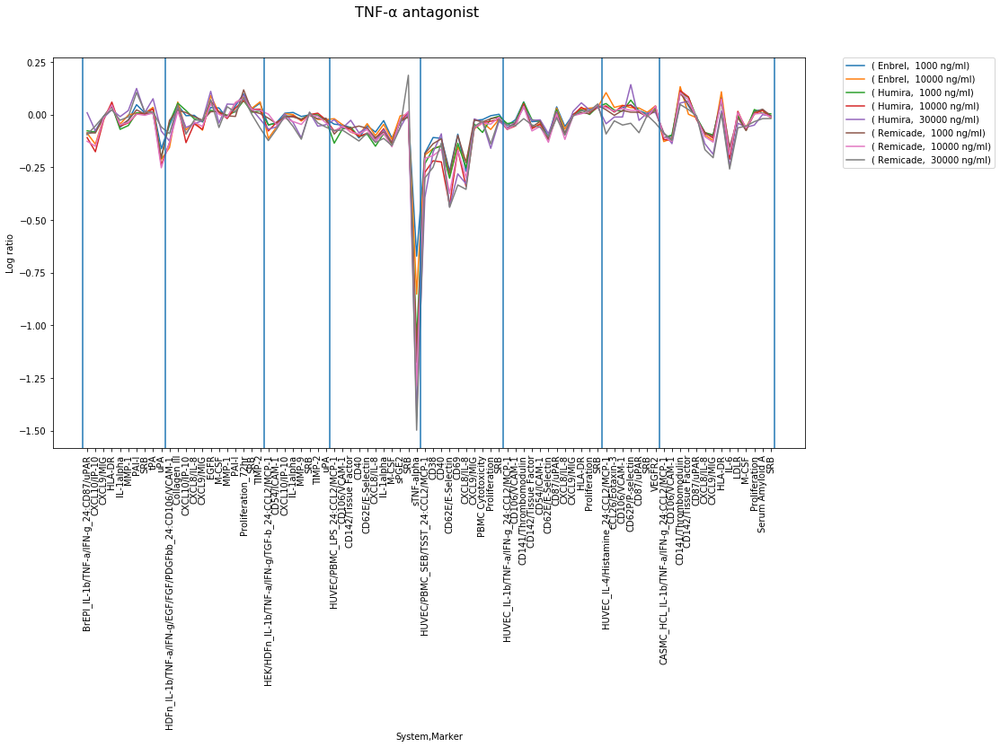

Vitamin D receptor agonist


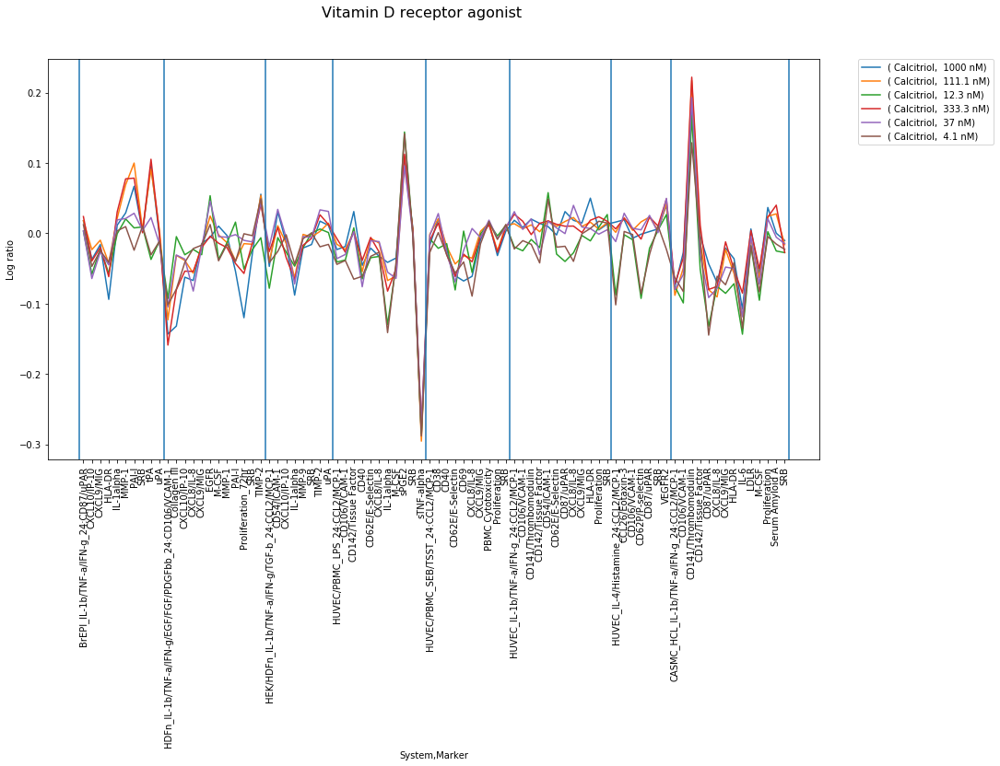

In [10]:
import matplotlib as mpl
mpl.rcParams['figure.max_open_warning'] = 100

for mech in data.index.get_level_values(0).unique().values: # Plot all mechanisms
    print(mech)
    ax = data.loc[mech].T.plot(
        figsize=(15,8),
        sharey=True,
        subplots=False);
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
    x, x_labels, v_line_positions = pr.v_line_positions();
    plt.xticks(x, x_labels, rotation='vertical');
    plt.ylabel('Log ratio');
    plt.suptitle(mech, fontsize = 16)
    # add vertical lines
    for lp in v_line_positions:
        plt.axvline(x=lp-0.5)
    plt.show()
        

# Plot each profile on its own

In [ ]:

for mech in data.index.get_level_values(0).unique().values:
    ax = data.loc[mech].T.plot(
        figsize=(15, 30),
        sharey=True,
        subplots=True);

    [axn.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) for axn in ax];
    plt.xticks(x, x_labels, rotation='vertical');
    plt.ylabel('Log ratio');
    plt.suptitle(mech, size = 16);